<a href="https://colab.research.google.com/github/elrichgro/irccam-pmodwrc/blob/main/irccam/notebooks/RGB_algo_experiments.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import cv2
import numpy as np
import h5py
import os
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Setup

In [169]:
HDF5_DATASETS_PATH = "/content/drive/My Drive/datasets"
TEST_IMAGE_PATH = "/content/drive/My Drive/datasets/notebooks/test_images"

def load_img_hdf5(timestamp):
  day = timestamp[:8]
  with h5py.File(os.path.join(HDF5_DATASETS_PATH, 'dataset_v1', '{}.h5'.format(day)), "r") as f:
    idx = None
    for i, ts in enumerate(f['timestamp']):
      if timestamp[:12] in ts:
        idx = i
    assert idx is not None, "Could not find image for timestamp {}".format(timestamp)
    return cv2.cvtColor(np.nan_to_num(f['vis'][idx], nan=255).astype(np.uint8), cv2.COLOR_BGR2RGB)

def load_ir_img_hdf5(timestamp):
  day = timestamp[:8]
  with h5py.File(os.path.join(HDF5_DATASETS_PATH, 'dataset_v1', '{}.h5'.format(day)), "r") as f:
    idx = None
    for i, ts in enumerate(f['timestamp']):
      if timestamp[:12] in ts:
        idx = i
    assert idx is not None, "Could not find image for timestamp {}".format(timestamp)
    img =  np.nan_to_num(f['irc'][idx], nan=255.0)
    img -= 50.0
    img[np.where(img < 0.0)] = 0.0
    img *= 255.0/120.0
    img[np.where(img > 255.0)] = 255.0
    return img.astype(np.uint8)

def load_img(timestamp):
    img = cv2.imread(os.path.join(TEST_IMAGE_PATH, '{}_0.jpg'.format(timestamp)))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img

def load_processed_img(timestamp):
    img = load_img(timestamp)
    img = process_vis_img(img)
    return img

# from https://stackoverflow.com/a/23316542
def rotate_image(image, angle):
    row, col, _ = image.shape
    center = tuple(np.array([row, col]) / 2)
    rot_mat = cv2.getRotationMatrix2D(center, angle, 1.0)
    new_image = cv2.warpAffine(image, rot_mat, (col, row))
    return new_image

def process_vis_img(img):
    processed_vis = cv2.resize(img, (640, 480))
    processed_vis = processed_vis[50:470, 105:525]
    # processed_vis = processed_vis[225:295, 280:350]
    processed_vis = cv2.flip(processed_vis, 1)
    processed_vis = rotate_image(processed_vis, -130)
    # processed_vis = processed_vis.astype("float32")
    crop = 60
    processed_vis = processed_vis[crop:420-crop, crop:420-crop]

    # apply_mask(processed_vis, MASK)

    return processed_vis

In [135]:
# Red-Blue Ratios
class RBRatio:
  def __init__(self):
    pass

  def apply(self, image):
    zeros = np.logical_or(image[:, :, 1] == 0, image[:, :, 2] == 0)
    nans = np.logical_or(np.logical_or(np.isnan(image[:, :, 0]), np.isnan(image[:, :, 1])), np.isnan(image[:, :, 2]))

    ok = np.logical_not(np.logical_or(zeros, nans))
    rat = np.zeros(image.shape[:2])
    rat[ok] = image[:, :, 0][ok] / image[:, :, 2][ok] + image[:, :, 0][ok] / image[:, :, 1][ok]

    # print(rat.min(), rat.max(), rat.max()-rat.min())

    img = rat
    img -= img.min()
    # img *= 255.0/img.max()
    img *= 255.0/4
    img[np.where(img > 255.0)] = 255.0
    img[np.where(img < 0.0)] = 0.0
    img = img.astype(np.uint8)

    return img

# Background subtraction (inspired by https://journals.ametsoc.org/jtech/article/29/4/527/3856/An-Automated-Cirrus-Cloud-Detection-Method-for-a)
class SubtractMorphology:
  def __init__(self, morph_shape=cv2.MORPH_RECT, morph_size=(200,200)):
    self.morph_shape = morph_shape
    self.morph_size = morph_size

  def apply(self, img):
    kernel = cv2.getStructuringElement(self.morph_shape, self.morph_size)
    bg = cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel)
    return img - bg


# Thresholds
class AdaptiveThreshold:
  def __init__(self, max=255, method=cv2.ADAPTIVE_THRESH_GAUSSIAN_C, thresh_type=cv2.THRESH_BINARY, block_size=191, C=2, morph_shape=cv2.MORPH_ELLIPSE, morph_size=(3,3)):
    self.max=max
    self.method=method
    self.thresh_type=thresh_type
    self.block_size=block_size
    self.C=C
    self.morph_shape=morph_shape
    self.morph_size=morph_size

  def apply(self, img):
    img = cv2.adaptiveThreshold(img,self.max,self.method,self.thresh_type,self.block_size,self.C)
    # Morphology to remove noise
    if self.morph_shape:
      kernel = cv2.getStructuringElement(self.morph_shape,self.morph_size)
      img = cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel)

    return img

class FixedThreshold:
  def __init__(self, threshold=160, max=255, thresh_type=cv2.THRESH_BINARY):
    self.threshold = threshold
    self.max = max
    self.thresh_type = thresh_type

  def apply(self, img):
    _, result = cv2.threshold(img,self.threshold,self.max,self.thresh_type)
    return result

# Pipeline
class Pipeline:
  def __init__(self, methods):
    self.methods = methods

  def process(self, imgs):
    results = []
    for img in imgs:
      result = [img]
      for method in self.methods:
        img = method.apply(img)
        result.append(img)
      results.append(result)
    return results

# Plot results
def plot_ax(gs, img):
  ax = plt.subplot(gs)
  plt.axis('off')
  ax.set_xticklabels([])
  ax.set_yticklabels([])
  ax.imshow(img)

def plot_results(results):
  dim_size = 6
  rows = len(results)
  cols = len(results[0])
  plt.figure(figsize = (dim_size*cols,dim_size*rows))
  gs = gridspec.GridSpec(rows, cols)
  gs.update(wspace=0.025, hspace=0.05) # set the spacing between axes. 

  for i in range(rows):
    for j in range(cols):
      plot_ax(gs[i*cols+j], results[i][j])

  plt.show()


# Blurring
# blur = cv2.blur(img_diff,(5,5))
# blur=cv2.medianBlur(blur,5)
# blur= cv2.GaussianBlur(blur,(5,5),0)
# blur= cv2.bilateralFilter(blur,9,75,75)
# img_diff=blur

## Adaptive Threshold vs Fixed Threshold

In [170]:
timestamps = [
'20180410120300',
'20180410142900',
'20180610103400',
'20180610143600',
'20180610150200',
'20180710080100'
]

In [171]:
imgs = [load_processed_img(timestamp) for timestamp in timestamps]

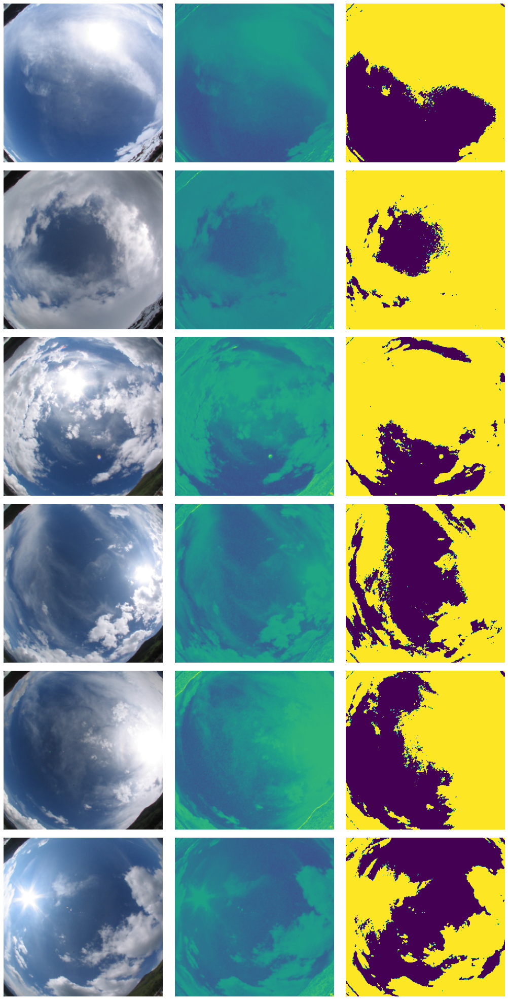

In [172]:
# Fixed Threshold
plot_results(Pipeline([
  RBRatio(),
  FixedThreshold(90)
]).process(imgs))

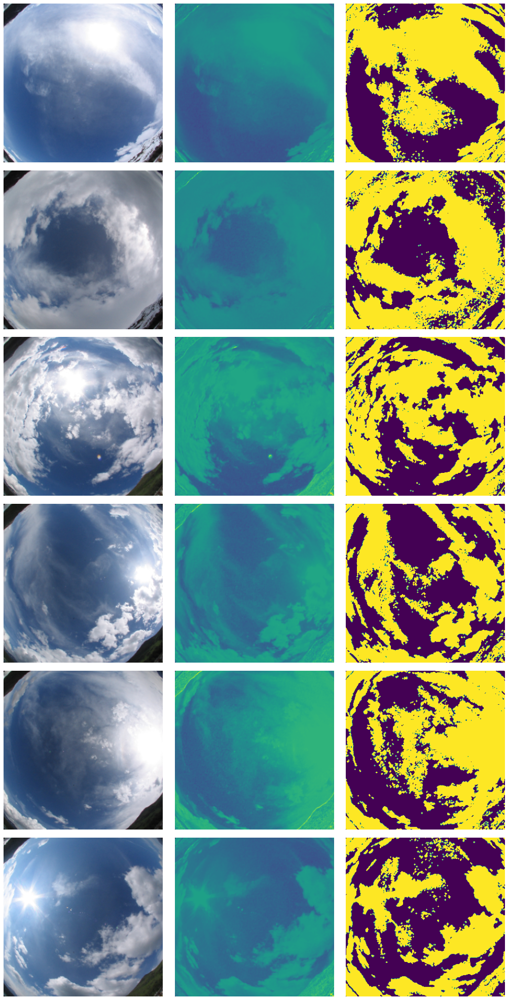

In [161]:
# Adaptive Threshold
plot_results(Pipeline([
  RBRatio(),
  AdaptiveThreshold()
]).process(imgs))

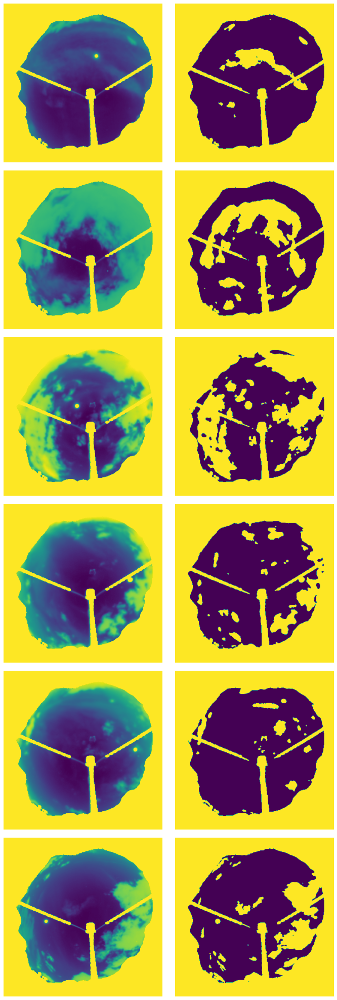

In [157]:
# IR Data
ir_imgs = [load_ir_img_hdf5(ts) for ts in timestamps]
plot_results(Pipeline([
  AdaptiveThreshold()
]).process(ir_imgs))

## Morphology subtraction

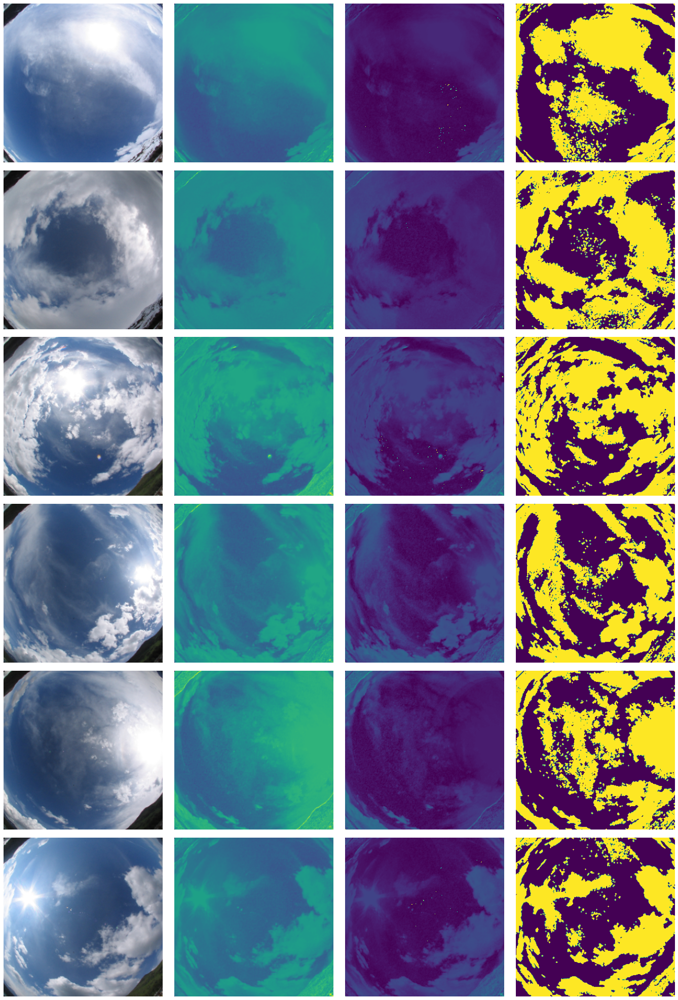

In [163]:
results = Pipeline([
  RBRatio(),
  SubtractMorphology(morph_shape=cv2.MORPH_ELLIPSE, morph_size=(200,200)),
  AdaptiveThreshold()
]).process(imgs)

plot_results(results)

## Background subtraction

In [175]:
file_dir = "/content/drive/My Drive/datasets/notebooks/test_background_sub"
files = os.listdir(file_dir)
files.sort()
files = [file[:14] for file in files][-40:]
bg_imgs = [load_processed_img(os.path.join(file_dir, file)) for file in files]

In [176]:
# bg_imgs = [rb_norm_diff(img) for img in bg_imgs]

fgbg = cv2.createBackgroundSubtractorMOG2(
    detectShadows=False, 
    varThreshold=24
    )
# fgbg = cv2.bgsegm.createBackgroundSubtractorMOG(
#     nmixtures=2, 
#     backgroundRatio=0.1
# )

results = []
for img in bg_imgs:
  mask = fgbg.apply(img)
  results.append([img, mask])

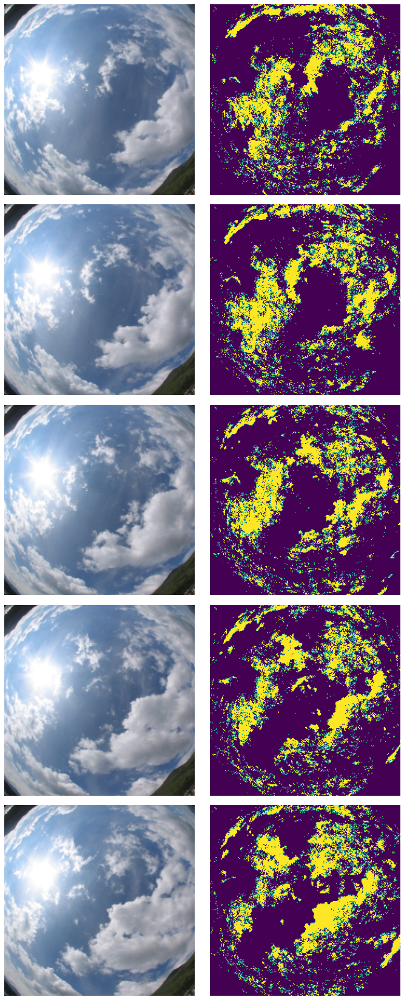

In [177]:
plot_results(results[-5:])

## Superpixel segmentation

In [153]:
from skimage.segmentation import slic, mark_boundaries, felzenszwalb

class SuperpixelSLIC:
  def __init__(self, n_segments=400, sigma=2, compactness=10.0):
    self.n_segments = n_segments
    self.sigma = sigma
    self.compactness = compactness

  def apply(self, img):
    segments = slic(img, n_segments=self.n_segments, sigma=self.sigma, compactness=self.compactness)
    return mark_boundaries(img, segments)

def superpixels_slic(img):
  segments = slic(
    img, 
    n_segments=400, 
    sigma=2,
    # compactness=1
  )
  return mark_boundaries(img, segments)

class SuperpixelFZ:
  def __init__(self, scale=50, sigma=0.5, min_size=50):
    self.scale = scale
    self.sigma = sigma
    self.min_size = min_size

  def apply(self, img):
    segments = felzenszwalb(img, scale=self.scale, sigma=self.sigma, min_size=self.min_size)
    return mark_boundaries(img, segments)


def superpixels_fz(img):
  segments = felzenszwalb(
      img, 
      scale=50, 
      sigma=0.5, 
      min_size=50)
  return mark_boundaries(img, segments)

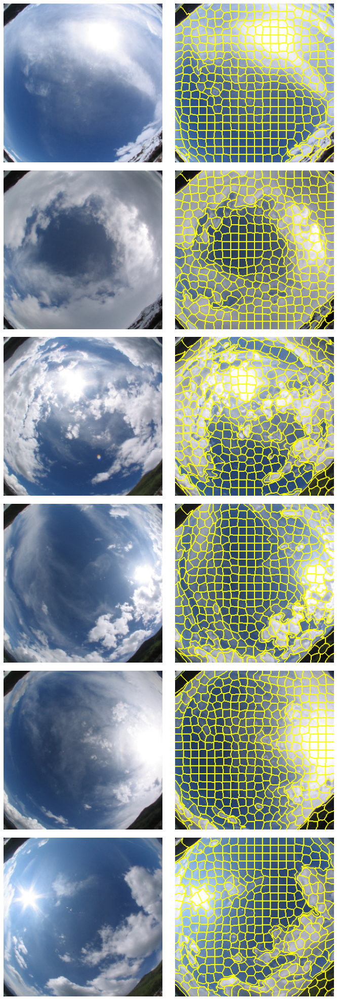

In [154]:
imgs = [load_processed_img(timestamp) for timestamp in timestamps]
results = Pipeline([
  SuperpixelSLIC()
]).process(imgs)

plot_results(results)

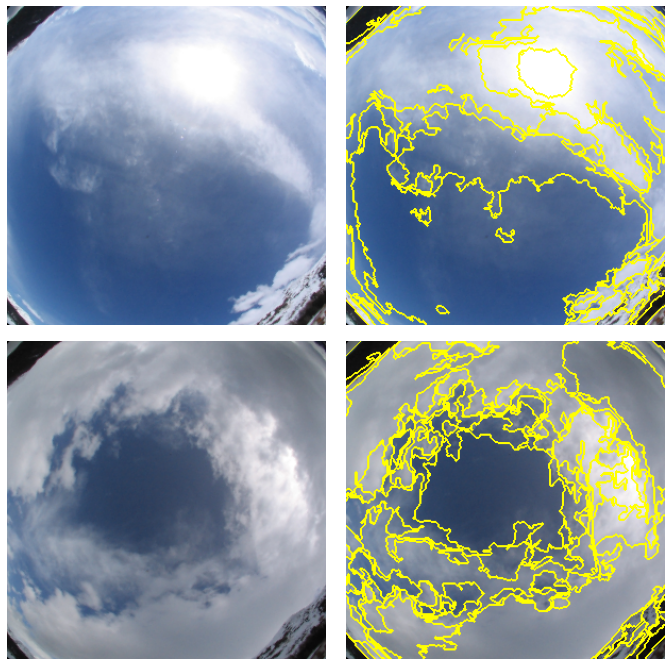

In [155]:
plot_results(Pipeline([
  SuperpixelFZ()
]).process(imgs[:2]))